# Packages Loading and Directories Setting

In [ ]:
%matplotlib inline
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scrublet as scr
import harmonypy as hm
import gseapy as gp
import re
import matplotlib.patheffects as PathEffects
from pathlib import Path

sc.settings.set_figure_params(dpi=100, facecolor="white")
results_dir = Path("./results")
fig_dir = results_dir / "figures"
h5ad_dir = results_dir / "h5ad"
fig_dir.mkdir(parents=True, exist_ok=True)
h5ad_dir.mkdir(parents=True, exist_ok=True)

sc.settings.figdir = fig_dir
print("Packages loaded and directories set up.")

Packages loaded and directories set up.


# Data Reading and Doublet Detecting

Processing 4 samples: ['EB', 'iMKd3', 'iMKd7', 'iMKd5']
Processing sample: EB
Processing Scrublet for sample: EB
Sample EB has 11757 cells, expected doublet rate: 0.0941
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.56
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 9.4%
	Estimated  = 25.0%
Elapsed time: 13.3 seconds


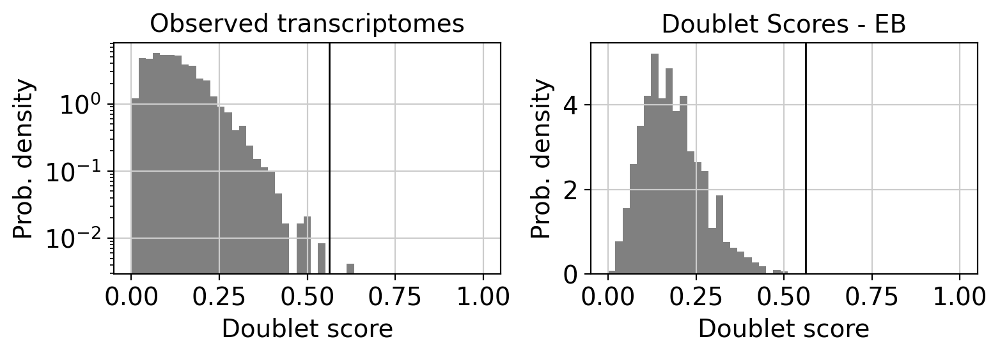

Detected 1 doublets in EB. Removing them now...
Remaining cells in EB: 11756
Processing sample: iMKd3
Processing Scrublet for sample: iMKd3
Sample iMKd3 has 19428 cells, expected doublet rate: 0.1554
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.70
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 6.2%
Overall doublet rate:
	Expected   = 15.5%
	Estimated  = 4.6%
Elapsed time: 26.4 seconds


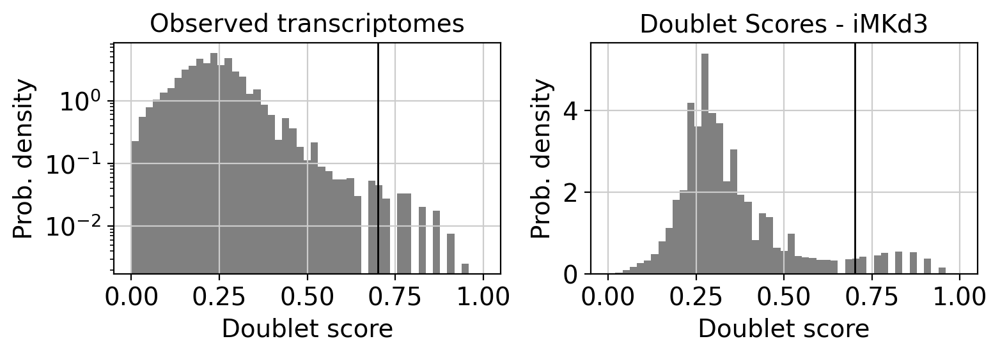

Detected 56 doublets in iMKd3. Removing them now...
Remaining cells in iMKd3: 19372
Processing sample: iMKd7
Processing Scrublet for sample: iMKd7
Sample iMKd7 has 10610 cells, expected doublet rate: 0.0849
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.29
Detected doublet rate = 4.1%
Estimated detectable doublet fraction = 31.5%
Overall doublet rate:
	Expected   = 8.5%
	Estimated  = 12.9%
Elapsed time: 11.8 seconds


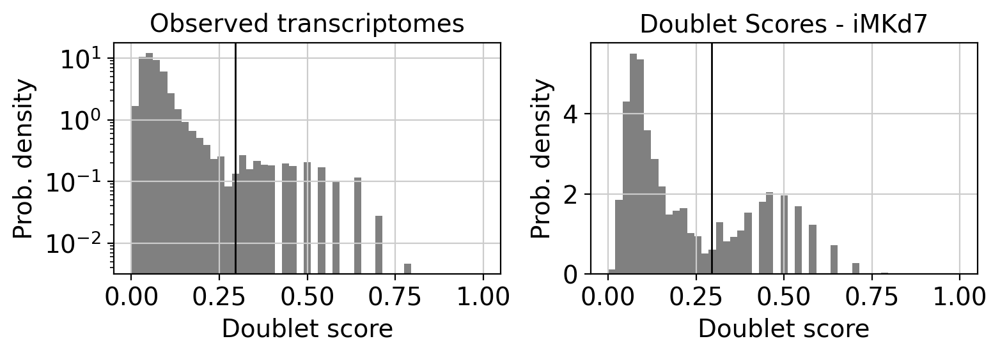

Detected 432 doublets in iMKd7. Removing them now...
Remaining cells in iMKd7: 10178
Processing sample: iMKd5
Processing Scrublet for sample: iMKd5
Sample iMKd5 has 9128 cells, expected doublet rate: 0.0730
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.70
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 7.3%
	Estimated  = 0.0%
Elapsed time: 10.9 seconds


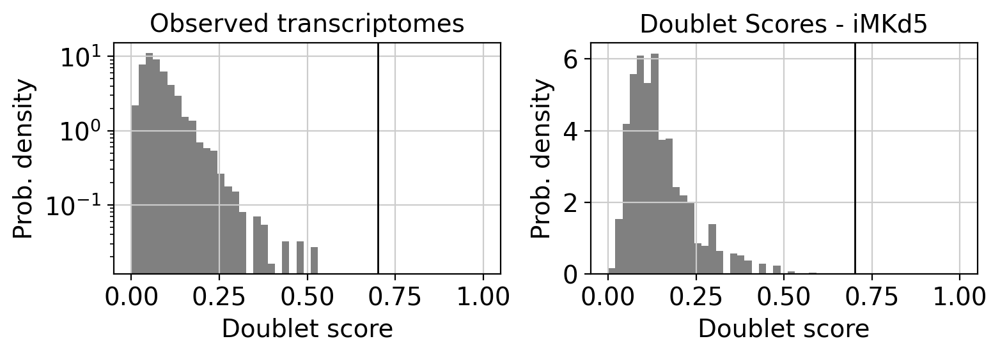

Detected 0 doublets in iMKd5. Removing them now...
Remaining cells in iMKd5: 9128
Each sample processed and filtered. Now merging datasets...
Merged filtered dataset has 50434 cells and 21824 genes.
Sample distribution:
sample
iMKd3    19372
EB       11756
iMKd7    10178
iMKd5     9128
Name: count, dtype: int64
Filtered merged data saved to 01_merged_doublets_removed.h5ad


In [17]:
data_dir = Path("./data")

samples = [d.name for d in data_dir.iterdir() if d.is_dir() and not d.name.startswith('.')]
adata_list = []

print(f"Processing {len(samples)} samples: {samples}")

for sample in samples:
    print(f"Processing sample: {sample}")
    sample_path = data_dir / sample
    
    adata_sample = sc.read_mtx(sample_path / "matrix.mtx.gz").T
    feature_path = sample_path / "genes.tsv.gz"
    genes = pd.read_csv(feature_path, header=None, sep='\t')
    adata_sample.var_names = genes[1].values
    adata_sample.var['gene_ids'] = genes[0].values
    barcodes = pd.read_csv(sample_path / "barcodes.tsv.gz", header=None, sep='\t')
    adata_sample.obs_names = barcodes[0].values
    adata_sample.var_names_make_unique()
    adata_sample.obs['sample'] = sample

    print(f"Processing Scrublet for sample: {sample}")
    sc.pp.filter_cells(adata_sample, min_genes=200)
    sc.pp.filter_genes(adata_sample, min_cells=3)

    n_cells = adata_sample.n_obs
    expected_rate = (n_cells / 1000) * 0.008 
    print(f"Sample {sample} has {n_cells} cells, expected doublet rate: {expected_rate:.4f}")
    
    scrub = scr.Scrublet(adata_sample.X, expected_doublet_rate=expected_rate)
    doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=2, 
                                                              min_cells=3, 
                                                              min_gene_variability_pctl=85, 
                                                              n_prin_comps=30)
    adata_sample.obs['doublet_scores'] = doublet_scores
    adata_sample.obs['predicted_doublets'] = predicted_doublets
    
    scrub.plot_histogram()
    plt.title(f"Doublet Scores - {sample}")
    # plt.savefig(fig_dir / f"{sample}_doublet_hist.png", bbox_inches='tight') 
    plt.show()
    plt.close()

    n_doublets = sum(predicted_doublets)
    print(f"Detected {n_doublets} doublets in {sample}. Removing them now...")
    
    adata_sample = adata_sample[~adata_sample.obs['predicted_doublets'], :].copy()
    
    print(f"Remaining cells in {sample}: {adata_sample.n_obs}")

    adata_list.append(adata_sample)

print("Each sample processed and filtered. Now merging datasets...")
adata = sc.concat(adata_list, index_unique='_', join='outer')
adata.obs_names_make_unique()

print(f"Merged filtered dataset has {adata.n_obs} cells and {adata.n_vars} genes.")
print("Sample distribution:")
print(adata.obs['sample'].value_counts())

adata.write(h5ad_dir / "01_merged_doublets_removed.h5ad")
print("Filtered merged data saved to 01_merged_doublets_removed.h5ad")

# Mitochondial and Ribosomal Genes Annotation and Quality Control

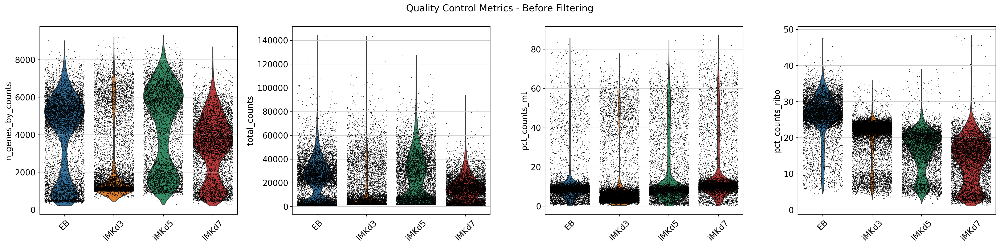

Cell counts before filtering: 50434


In [18]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo"], inplace=True, percent_top=None, log1p=False
    )

fig, axes = plt.subplots(1, 4, figsize=(24, 6))
qc_metrics = ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo']

for i, metric in enumerate(qc_metrics):
    sc.pl.violin(adata, keys=[metric], groupby='sample', jitter=0.4, show=False, ax=axes[i])
    axes[i].tick_params(axis='x', labelrotation=45)
    axes[i].set_xlabel('')

fig.suptitle("Quality Control Metrics - Before Filtering", fontsize=16)
fig.tight_layout()
fig.savefig(fig_dir / "qc_violin_before.png", bbox_inches='tight', dpi=300)
plt.show()

print(f"Cell counts before filtering: {adata.n_obs}")

<Figure size 600x600 with 0 Axes>

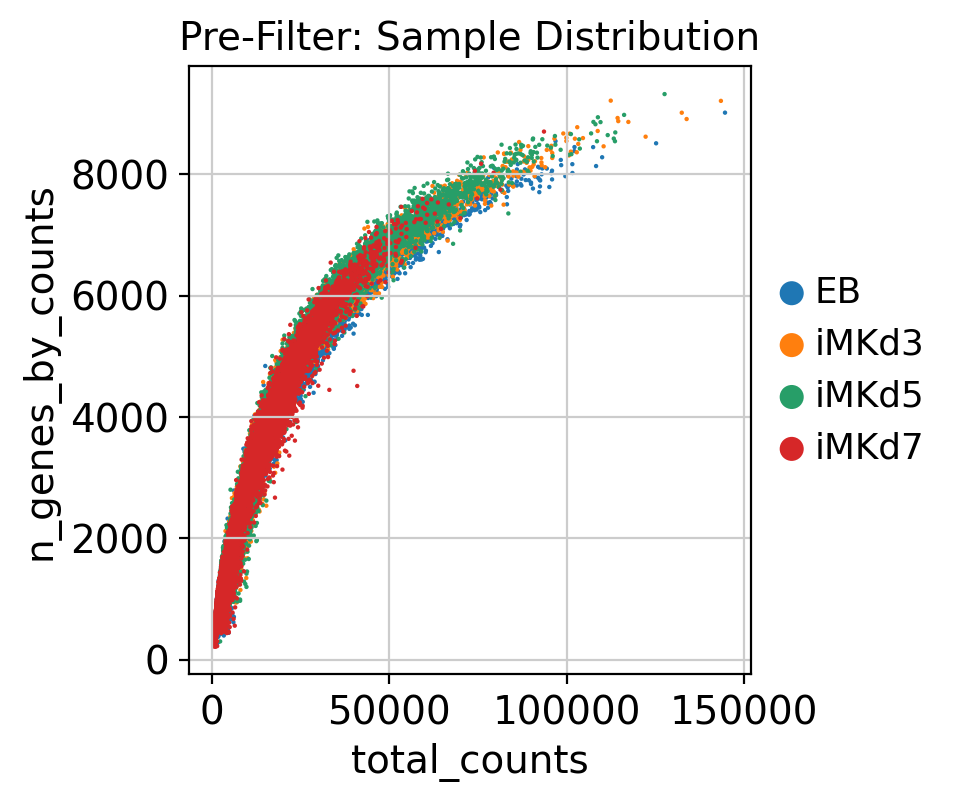

In [19]:
plt.figure(figsize=(6, 6))

sc.pl.scatter(
    adata, 
    x="total_counts", 
    y="n_genes_by_counts", 
    color="sample",
    title="Pre-Filter: Sample Distribution",
    size=10,
    show=False
)

plt.savefig(fig_dir / "scatter_pre_filter_by_sample.png", bbox_inches='tight', dpi=300)
plt.show()

<Figure size 600x600 with 0 Axes>

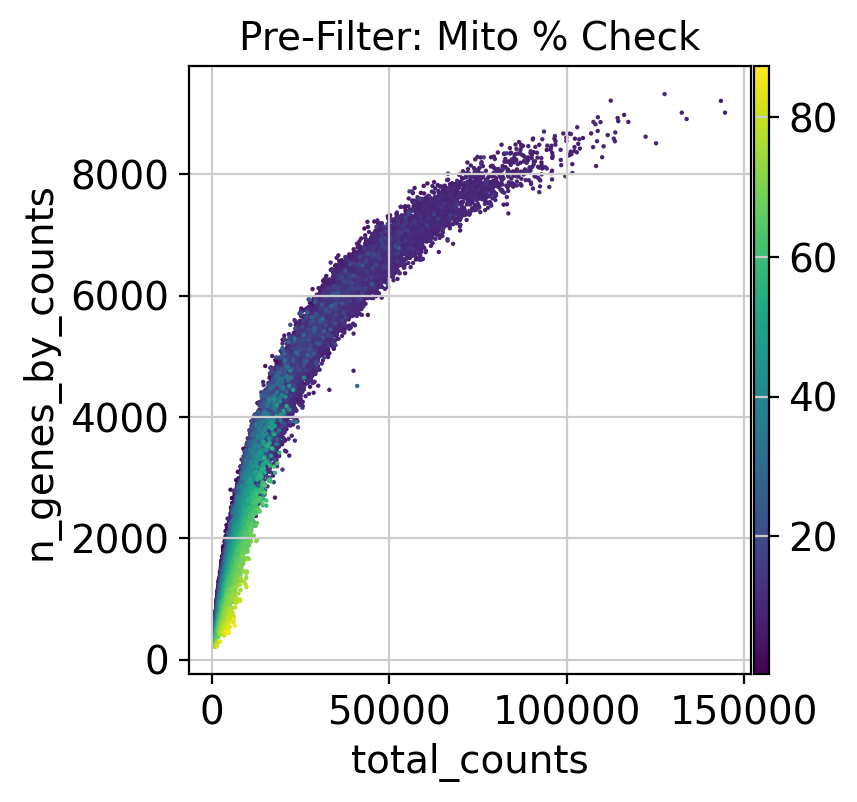

In [20]:
plt.figure(figsize=(6, 6))

sc.pl.scatter(
    adata, 
    x="total_counts", 
    y="n_genes_by_counts", 
    color="pct_counts_mt",
    title="Pre-Filter: Mito % Check",
    size=10,
    show=False
)

plt.savefig(fig_dir / "scatter_pre_filter_by_mt.png", bbox_inches='tight', dpi=300)
plt.show()

In [21]:
min_genes = 200
max_genes = 10000
max_counts = 80000
min_counts = 2500
max_mt = 15

adata = adata[
    (adata.obs['n_genes_by_counts'] > min_genes) &
    (adata.obs['n_genes_by_counts'] < max_genes) &
    (adata.obs['total_counts'] > min_counts) &
    (adata.obs['total_counts'] < max_counts) &
    (adata.obs['pct_counts_mt'] < max_mt)
]

print(f"Cell counts after filtering: {adata.n_obs}")

Cell counts after filtering: 27624


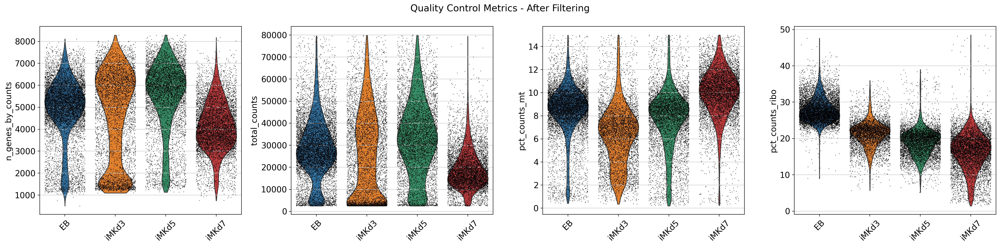

In [22]:
fig, axes = plt.subplots(1, 4, figsize=(24, 6))
for i, metric in enumerate(qc_metrics):
    sc.pl.violin(adata, keys=[metric], groupby='sample', jitter=0.4, show=False, ax=axes[i])
    axes[i].tick_params(axis='x', labelrotation=45)
    axes[i].set_xlabel('')

fig.suptitle("Quality Control Metrics - After Filtering", fontsize=16)
fig.tight_layout()
fig.savefig(fig_dir / "qc_violin_after.png", bbox_inches='tight', dpi=300)
plt.show()

<Figure size 600x600 with 0 Axes>

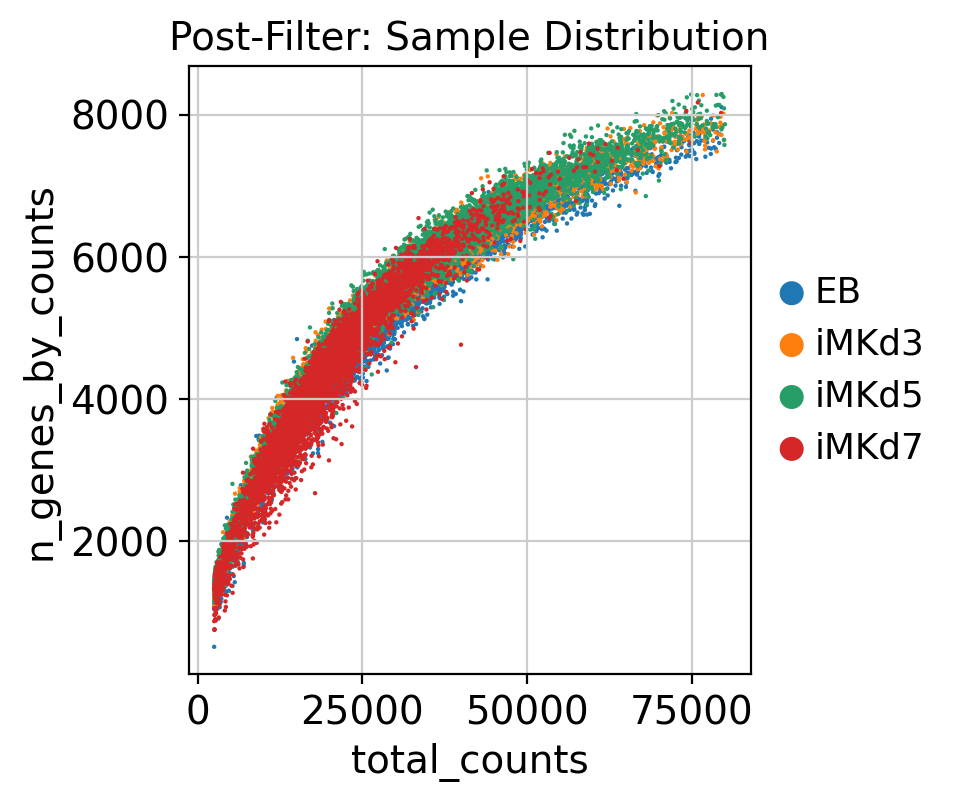

In [23]:
plt.figure(figsize=(6, 6))

sc.pl.scatter(
    adata, 
    x="total_counts", 
    y="n_genes_by_counts", 
    color="sample",
    title="Post-Filter: Sample Distribution",
    size=10,
    show=False
)

plt.savefig(fig_dir / "scatter_post_filter_by_sample.png", bbox_inches='tight', dpi=300)
plt.show()

<Figure size 600x600 with 0 Axes>

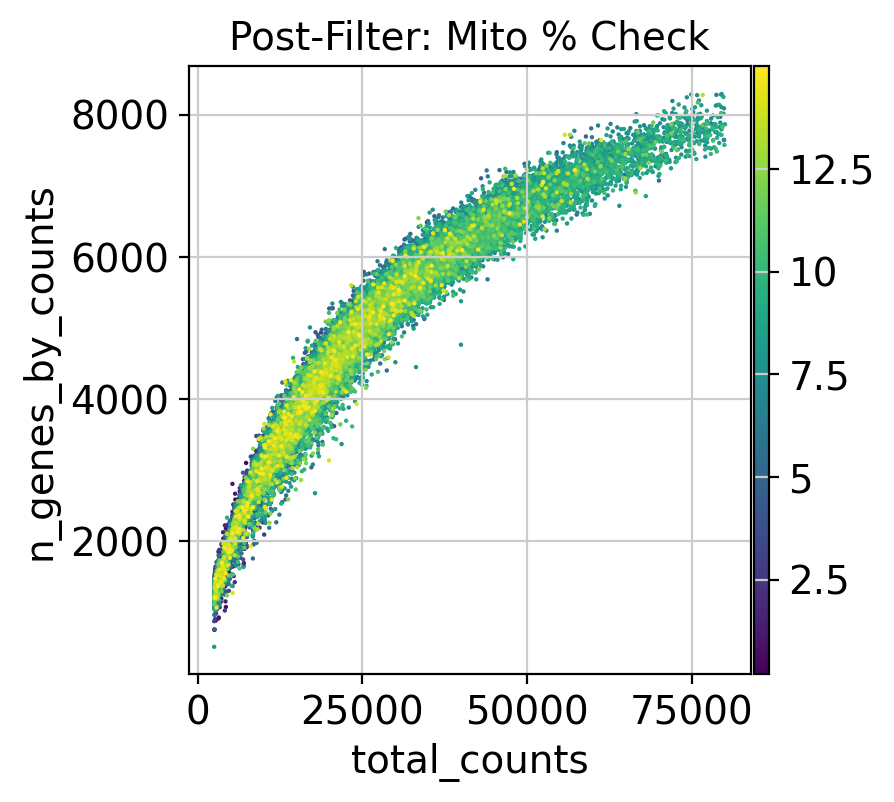

In [24]:
plt.figure(figsize=(6, 6))

sc.pl.scatter(
    adata, 
    x="total_counts", 
    y="n_genes_by_counts", 
    color="pct_counts_mt",
    title="Post-Filter: Mito % Check",
    size=10,
    show=False
)

plt.savefig(fig_dir / "scatter_post_filter_by_mt.png", bbox_inches='tight', dpi=300)
plt.show()

In [25]:
adata.layers["counts"] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

adata.raw = adata
adata.write(h5ad_dir / "02_filtered_normalized.h5ad")
print("Filtered and normalized data saved to 02_filtered_normalized.h5ad")

/tmp/ipykernel_1367791/1799497747.py:1: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata.layers["counts"] = adata.X.copy()


Filtered and normalized data saved to 02_filtered_normalized.h5ad


# Cell Cycle Genes Scoring and Regression

Processing cell cycle scoring...
Selecting HVGs...


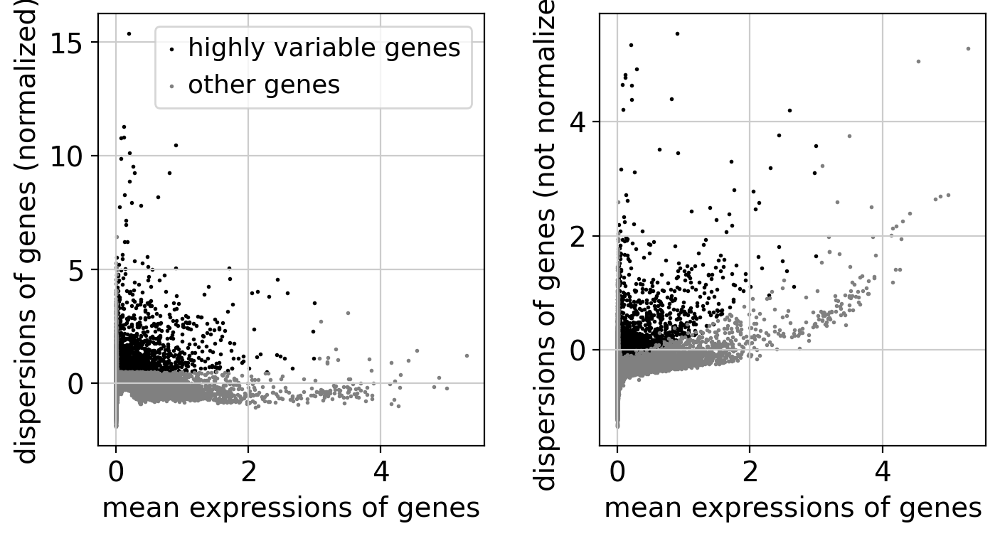

Retained HVG count: 1617
Plotting PCA before regression...


/home/xuanzhi/anaconda3/envs/scanpy/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


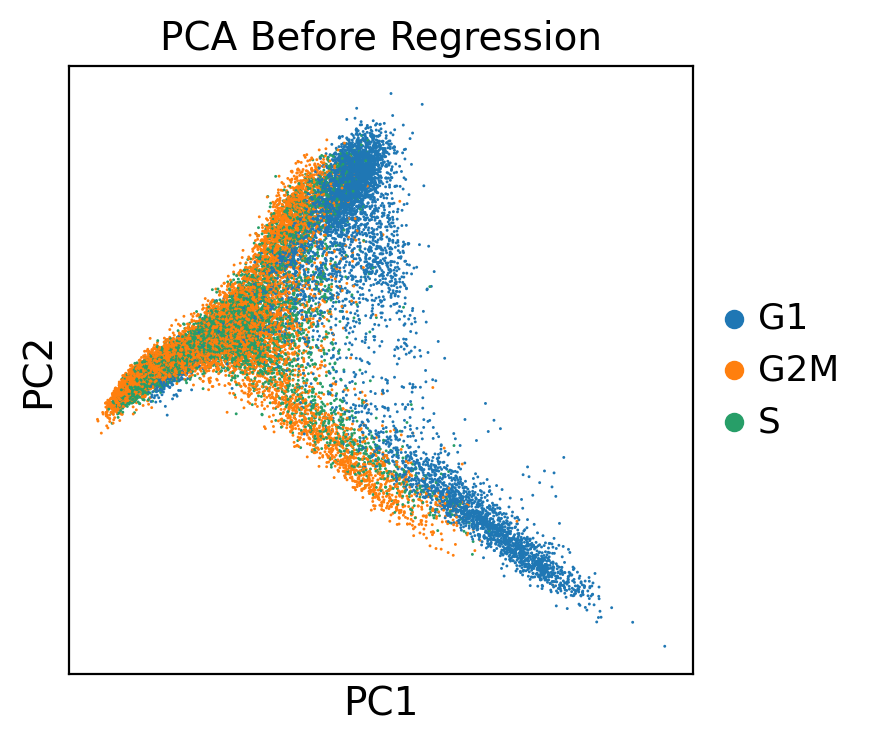

Regressing out cell cycle...
Scaling & PCA after regression...


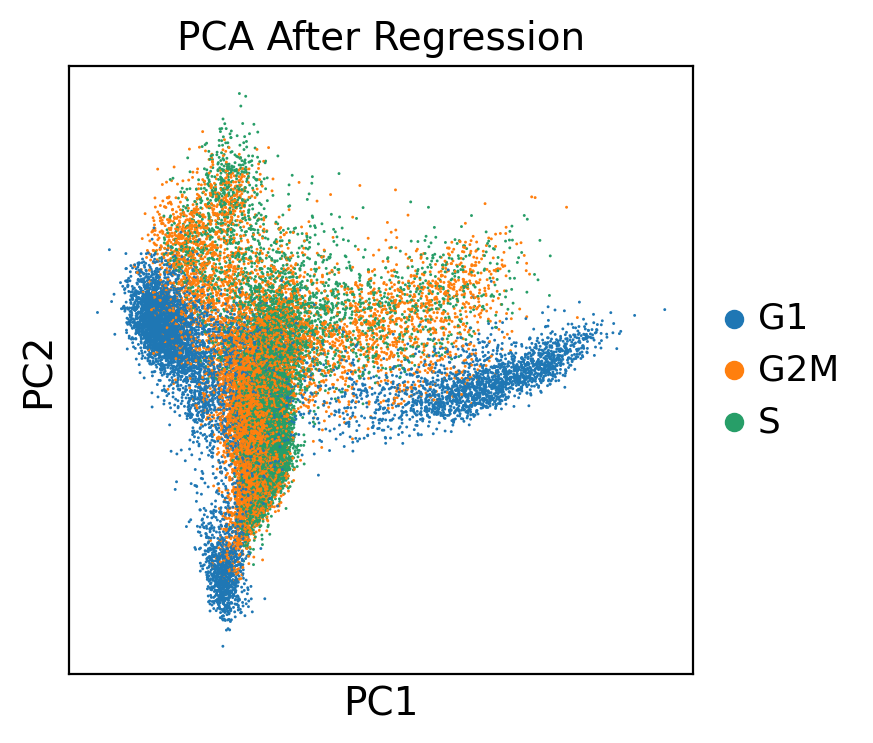

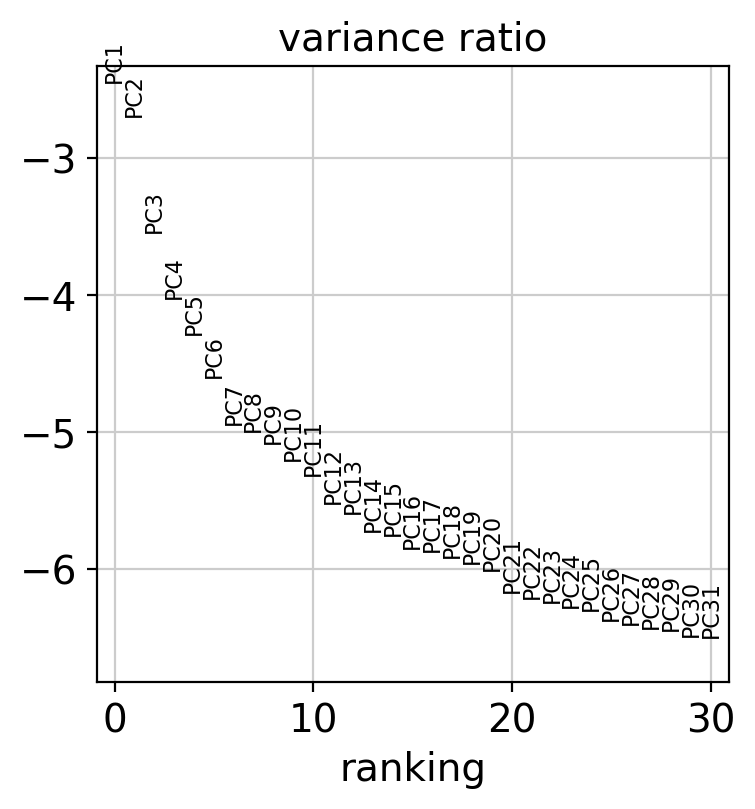

Cell cycle regression completed and data saved to 03_scaled_pca.h5ad


In [26]:
print("Processing cell cycle scoring...")
s_genes = [
    'MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 
    'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'NASP', 
    'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 
    'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 
    'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8'
]
g2m_genes = [
    'HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 
    'NUF2', 'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 
    'CKAP2L', 'CKAP2', 'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 
    'KIF20B', 'HJURP', 'CDCA3', 'HN1', 'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 
    'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 
    'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA'
]


s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

print(f"Selecting HVGs...")
sc.pp.highly_variable_genes(
    adata, 
    min_mean=0.0125, 
    max_mean=3, 
    min_disp=0.5, 
    batch_key='sample' 
)
sc.pl.highly_variable_genes(adata, show=False)
plt.savefig(fig_dir / "_hvg_plot.png", bbox_inches='tight', dpi=300)
plt.show()

adata.raw = adata 
adata = adata[:, adata.var.highly_variable].copy()
print(f"Retained HVG count: {adata.n_vars}")

print(f"Plotting PCA before regression...")
adata_before = adata.copy()
sc.pp.scale(adata_before, max_value=10)
sc.tl.pca(adata_before, svd_solver='arpack')
sc.pl.pca_scatter(
    adata_before, 
    color='phase', 
    title='PCA Before Regression', 
    show=False
)
plt.savefig(fig_dir / "pca_before_regression.png", bbox_inches='tight', dpi=300)
plt.show()

del adata_before

print(f"Regressing out cell cycle...")
sc.pp.regress_out(adata, ['S_score', 'G2M_score'])

print(f"Scaling & PCA after regression...")
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_scatter(
    adata, 
    color='phase', 
    title='PCA After Regression', 
    show=False
)
plt.savefig(fig_dir / "pca_after_regression.png", bbox_inches='tight', dpi=300)
plt.show()

sc.pl.pca_variance_ratio(adata, log=True, save="_pca_variance.png")

adata.write(h5ad_dir / "03_scaled_pca.h5ad")
print(f"Cell cycle regression completed and data saved to 03_scaled_pca.h5ad")

# Batch Effect Removing and Clustering

Calculating original UMAP before Harmony...


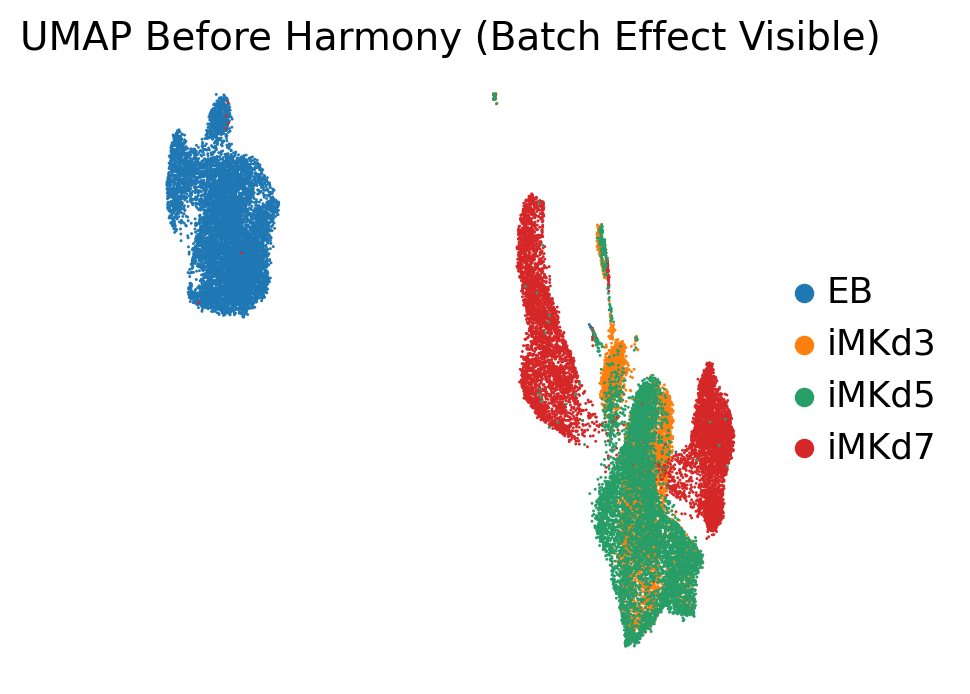

2025-11-28 21:30:03,150 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Running Harmony integration...


2025-11-28 21:30:04,816 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-11-28 21:30:04,883 - harmonypy - INFO - Iteration 1 of 10
2025-11-28 21:30:08,565 - harmonypy - INFO - Iteration 2 of 10
2025-11-28 21:30:12,185 - harmonypy - INFO - Converged after 2 iterations


Calculating Neighbors & UMAP after Harmony...


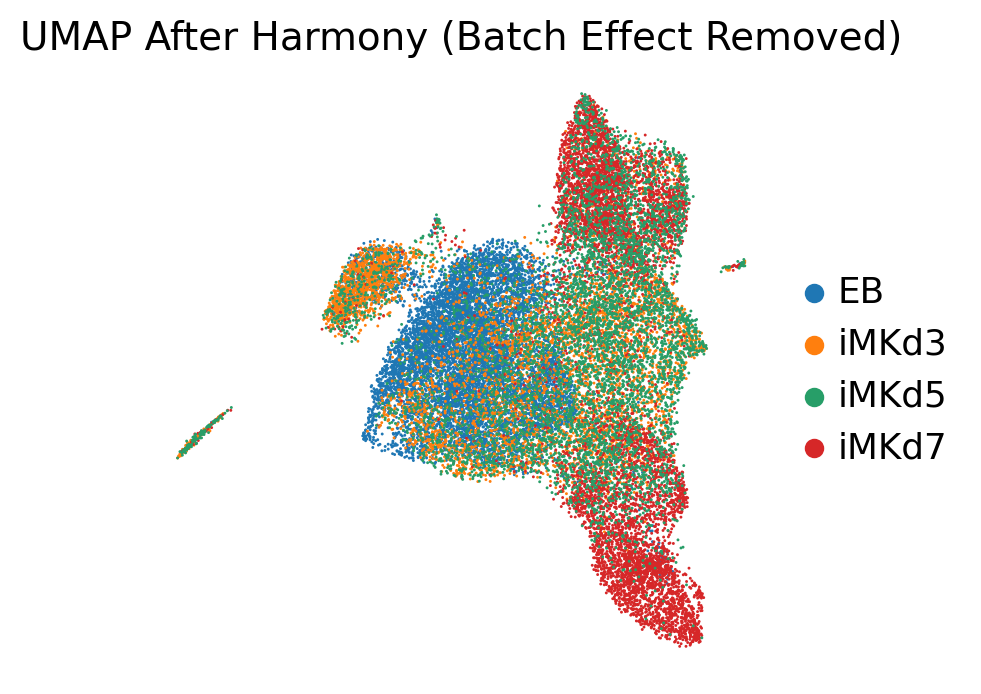

Running Leiden clustering on Harmonized data...


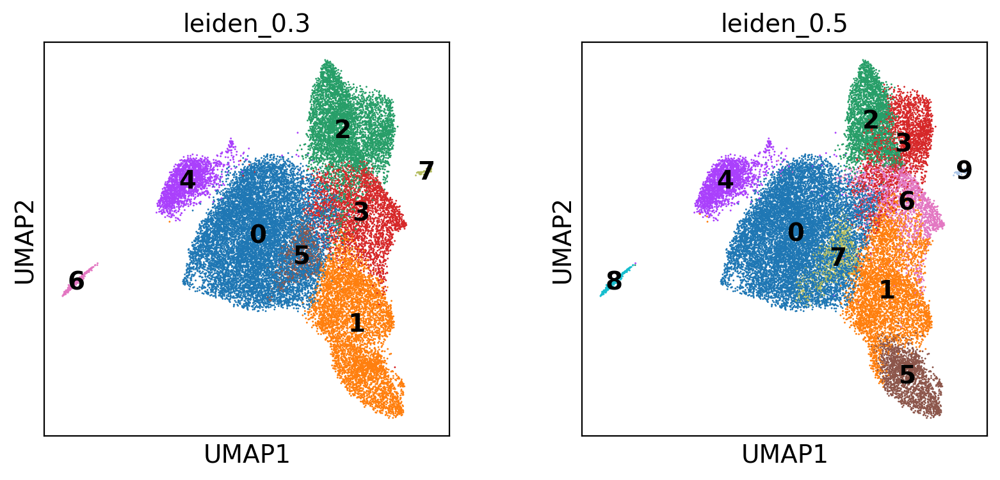

Harmony integration & Clustering done. Saved to 04_harmonized.h5ad.


In [30]:
print(f"Calculating original UMAP before Harmony...")

adata_raw_pca = adata.copy()
sc.pp.neighbors(adata_raw_pca, n_neighbors=30, use_rep='X_pca')
sc.tl.umap(adata_raw_pca)
sc.pl.embedding(
    adata_raw_pca, 
    basis='umap', 
    color='sample', 
    title='UMAP Before Harmony (Batch Effect Visible)', 
    frameon=False,
    save="_pre_harmony.png"
)

del adata_raw_pca

print(f"Running Harmony integration...")
sc.external.pp.harmony_integrate(adata, key='sample')

print(f"Calculating Neighbors & UMAP after Harmony...")
sc.pp.neighbors(adata, n_neighbors=30, use_rep='X_pca_harmony')
sc.tl.umap(adata)
sc.pl.embedding(
    adata, 
    basis='umap', 
    color='sample', 
    title='UMAP After Harmony (Batch Effect Removed)', 
    frameon=False,
    save="_post_harmony.png"
)

print("Running Leiden clustering on Harmonized data...")
sc.tl.leiden(adata, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_0.5')

sc.pl.umap(adata, color=['leiden_0.3', 'leiden_0.5'], legend_loc='on data', save="_clusters.png")

adata.write(h5ad_dir / "04_harmonized.h5ad")
print(f"Harmony integration & Clustering done. Saved to 04_harmonized.h5ad.")

# Marker Genes Detecting

Top 50 markers saved.
Plotting balanced heatmap...


/tmp/ipykernel_1367791/4117623962.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_genes = markers_df.groupby('group').head(5)['names'].unique().tolist()


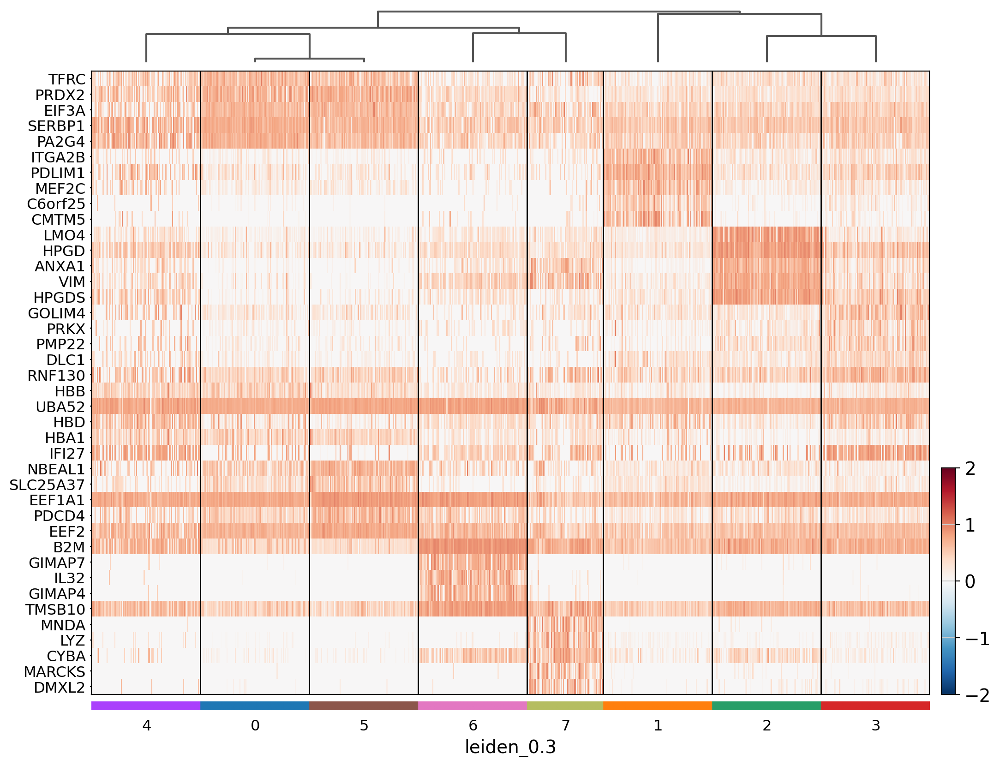

Plotting matrix plot (mean expression)...


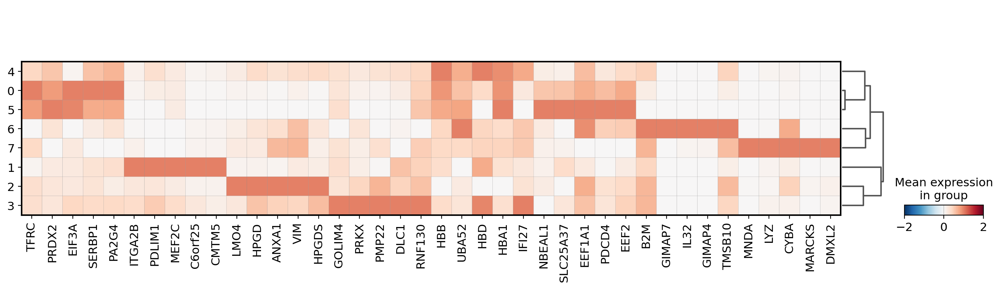

Clustering analysis & Marker visualization done.


In [ ]:
cluster_key = 'leiden_0.3'

sc.tl.rank_genes_groups(adata, cluster_key, method='wilcoxon', use_raw=True)
sc.tl.dendrogram(adata, groupby=cluster_key)

markers_df = sc.get.rank_genes_groups_df(adata, group=None)
markers_df = markers_df[~markers_df['names'].str.match(r'^(RPS|RPL|MT-)', case=False)]
top50_dict = {
    group: markers_df[markers_df['group'] == group]['names'].head(50).values 
    for group in adata.obs['leiden_0.3'].unique().sort_values()
}
pd.DataFrame(top50_dict).to_csv("results/markers_top50.csv")
print("Top 50 markers saved.")

plot_genes = markers_df.groupby('group').head(5)['names'].unique().tolist()
target_n = 100
balanced_idx = []
for group in adata.obs[cluster_key].unique():
    indices = adata.obs[adata.obs[cluster_key] == group].index
    if len(indices) > target_n:
        chosen = np.random.choice(indices, target_n, replace=False)
    else:
        chosen = indices
    balanced_idx.extend(chosen)

adata_balanced = adata[balanced_idx].copy()

print("Plotting balanced heatmap...")
sc.pl.heatmap(
    adata_balanced,
    var_names=plot_genes,
    groupby=cluster_key,
    use_raw=True, 
    swap_axes=True, 
    show_gene_labels=True,
    standard_scale='var',
    vmin=-2, vmax=2,
    cmap='RdBu_r',
    dendrogram=True,
    figsize=(12, 10),
    show=False
)
plt.savefig(fig_dir / "_marker_heatmap_balanced.png", bbox_inches='tight', dpi=300)
plt.show()

print("Plotting matrix plot (mean expression)...")
sc.pl.matrixplot(
    adata, 
    var_names=plot_genes, 
    groupby=cluster_key, 
    dendrogram=True,
    standard_scale='var', 
    cmap='RdBu_r', 
    vmin=-2, vmax=2,
    show=False
)
plt.savefig(fig_dir / "_marker_matrixplot.png", bbox_inches='tight', dpi=300)
plt.show()

print("Clustering analysis & Marker visualization done.")

# Cell Types Annotation

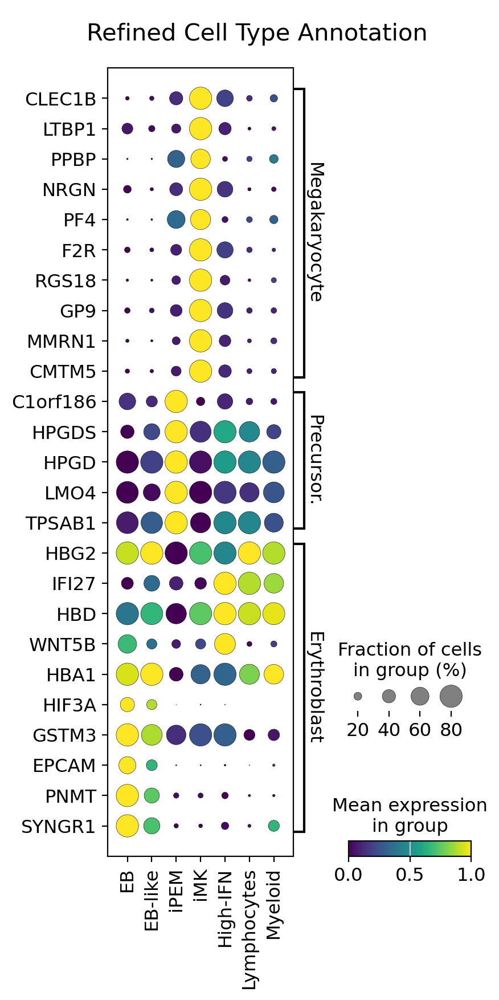

In [42]:
mapping_manual = {
    '0': 'EB',            # KLF1+, TFRC+ (Early Erythroid)
    '1': 'iMK',           # ITGA2B+, GP9+ (Megakaryocytes)
    '2': 'iPEM',          # LMO4+, KIT+ (Progenitors)
    '3': 'High-IFN',      # MX1+, IFITM3+ (Interferon response / Intermediate)
    '4': 'EB-like',       # HBB+, HBA1+ (Late Erythroid)
    '5': 'EB-like',       # HMBS+ (Erythroid related)
    '6': 'Lymphocytes',   # CD3E+ (To be removed)
    '7': 'Myeloid'        # LYZ+ (Monocytes/Neutrophils)
}

adata.obs['cell_type'] = adata.obs['leiden_0.3'].map(mapping_manual)

cell_type_order = ['EB', 'EB-like', 'iPEM', 'iMK', 'High-IFN', 'Lymphocytes', 'Myeloid']

existing_categories = [cat for cat in cell_type_order if cat in adata.obs['cell_type'].unique()]
adata.obs['cell_type'] = adata.obs['cell_type'].astype('category')
adata.obs['cell_type'] = adata.obs['cell_type'].cat.reorder_categories(existing_categories)

canonical_markers = {
    'Megakaryocyte': [
        'CLEC1B', 'LTBP1', 'PPBP', 'NRGN', 'PF4', 
        'F2R', 'RGS18', 'GP9', 'MMRN1', 'CMTM5'
    ],
    
    'Precursor (iPEM)': [
        'C1orf186', 'HPGDS', 'HPGD', 'LMO4', 'TPSAB1'
    ],

    'Erythroblast': [
        'HBG2', 'IFI27', 'HBD', 'WNT5B', 'HBA1', 
        'HIF3A', 'GSTM3', 'EPCAM', 'PNMT', 'SYNGR1'
    ]
}

sc.pl.dotplot(
    adata, 
    canonical_markers, 
    groupby='cell_type', 
    standard_scale='var', 
    cmap='viridis',
    dot_max=0.8,
    expression_cutoff=0.05,
    swap_axes=True,
    show=False
)

plt.suptitle("Refined Cell Type Annotation", fontsize=15, y=0.9)
plt.savefig("results/figures/annotation_dotplot.png", bbox_inches='tight', dpi=300)
plt.show()

Plotting final UMAP with annotations...


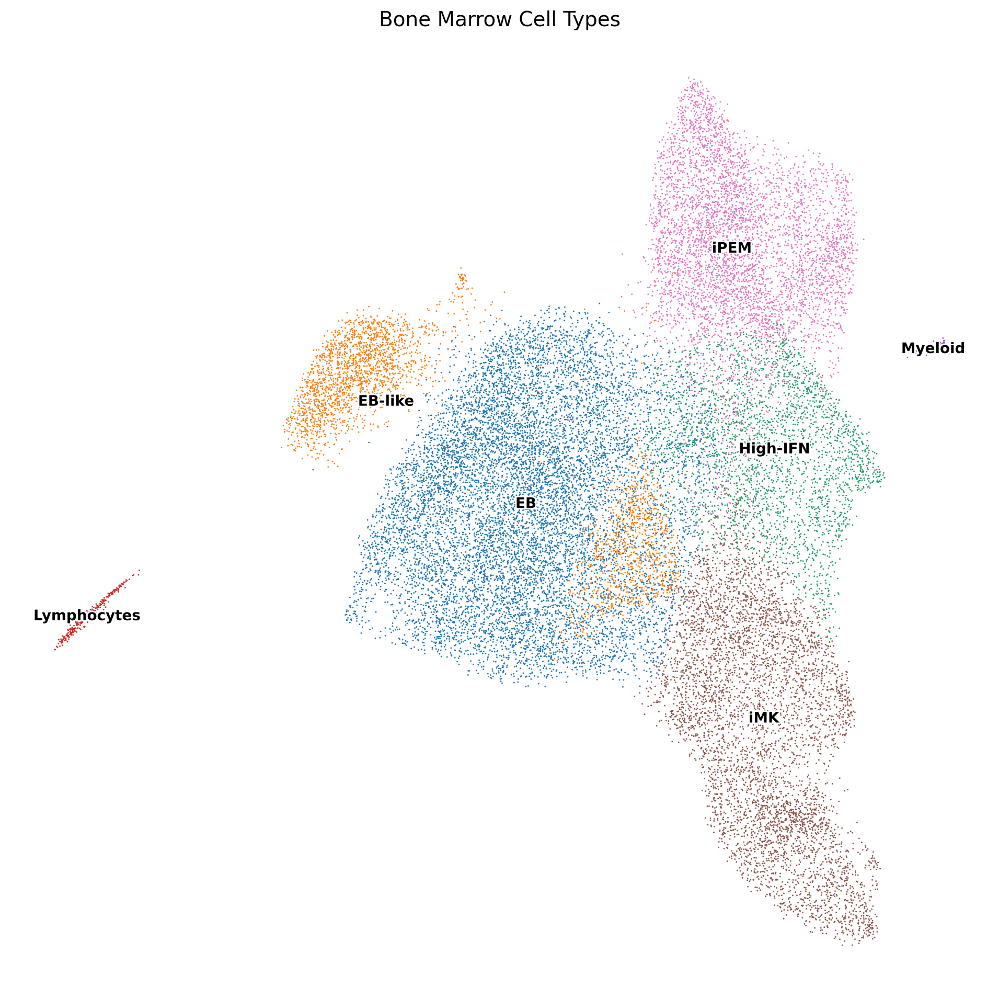

Cell type annotation completed.
cell_type
EB             10906
iMK             5259
iPEM            5103
EB-like         3125
High-IFN        2880
Lymphocytes      281
Myeloid           70
Name: count, dtype: int64


In [43]:
fig, ax = plt.subplots(figsize=(12, 12))
adata.obs[cluster_key] = adata.obs[cluster_key].astype(str)
adata.obs['cell_type'] = adata.obs[cluster_key].map(mapping_manual)

print("Plotting final UMAP with annotations...")

sc.pl.umap(
    adata, 
    color='cell_type',
    ax=ax,
    legend_loc='on data',
    legend_fontsize=10,
    legend_fontoutline=2,
    title='Bone Marrow Cell Types',
    frameon=False,
    save="_annotation_final.png"
)

print("Cell type annotation completed.")
print(adata.obs['cell_type'].value_counts())

Plotting Marker Gene Stacked Violin...


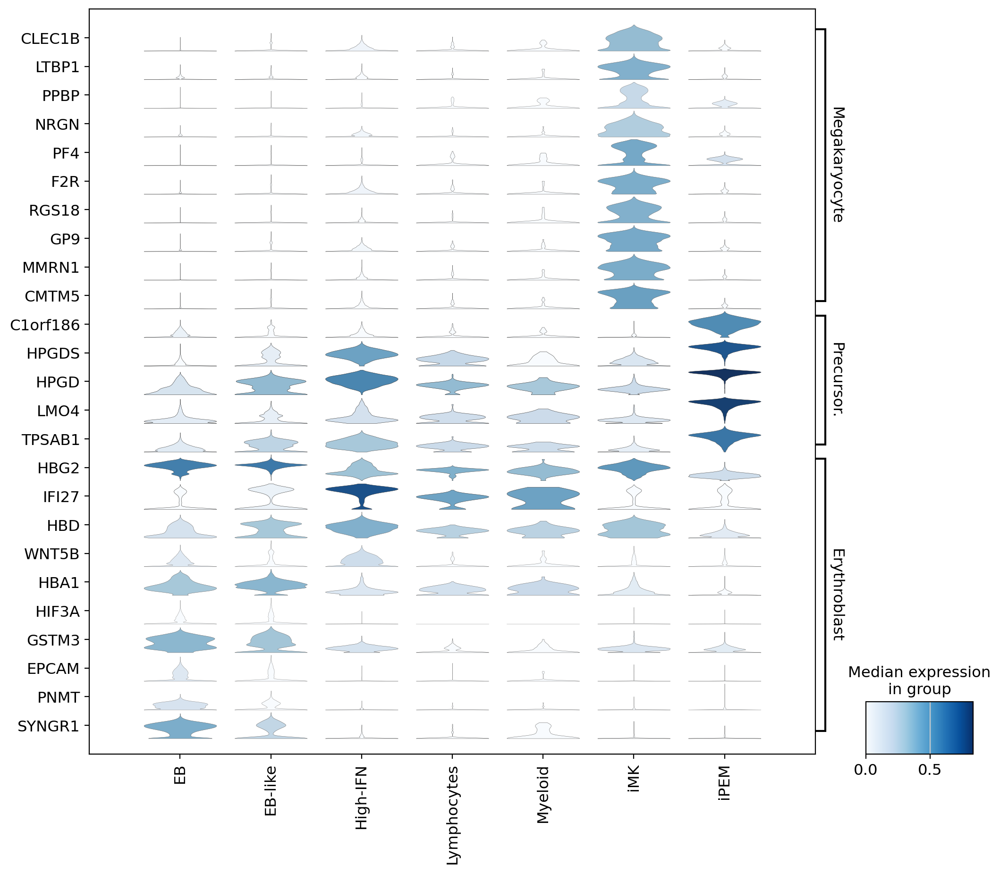

Stacked Violin Plot saved.
Plotting Marker Gene UMAP Expression...


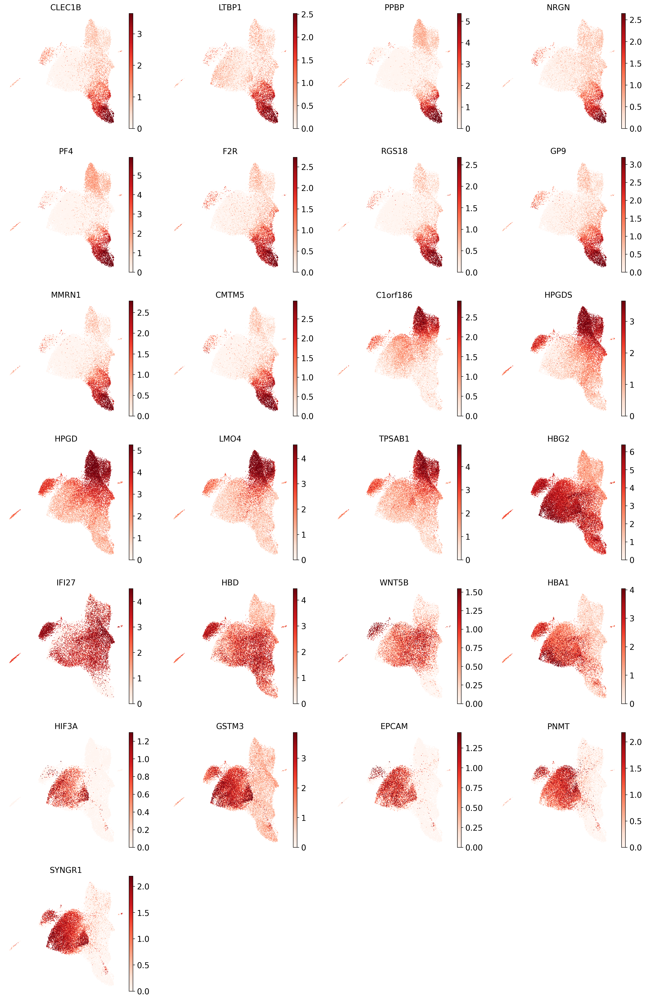

Marker Gene UMAP Expression plots saved.


In [44]:
flat_list_for_plots = [m for markers in canonical_markers.values() for m in markers]
flat_list_for_plots = list(dict.fromkeys(flat_list_for_plots))

print("Plotting Marker Gene Stacked Violin...")

sc.pl.stacked_violin(
    adata, 
    canonical_markers, 
    groupby='cell_type',
    swap_axes=True,
    use_raw=True, 
    standard_scale='var',
    dendrogram=False,
    figsize=(12, 10),
    save="_marker_stacked_violin.png"
)
print("Stacked Violin Plot saved.")


print("Plotting Marker Gene UMAP Expression...")
sc.pl.umap(
    adata, 
    color=flat_list_for_plots, 
    use_raw=True, 
    color_map='Reds',
    frameon=False,
    vmin=0, vmax='p99',
    ncols=4,
    save="_marker_expression_umap.png"
)

print("Marker Gene UMAP Expression plots saved.")

Sample proportion stacked bar plot saved to: results/figures/sample_proportion_stacked.png


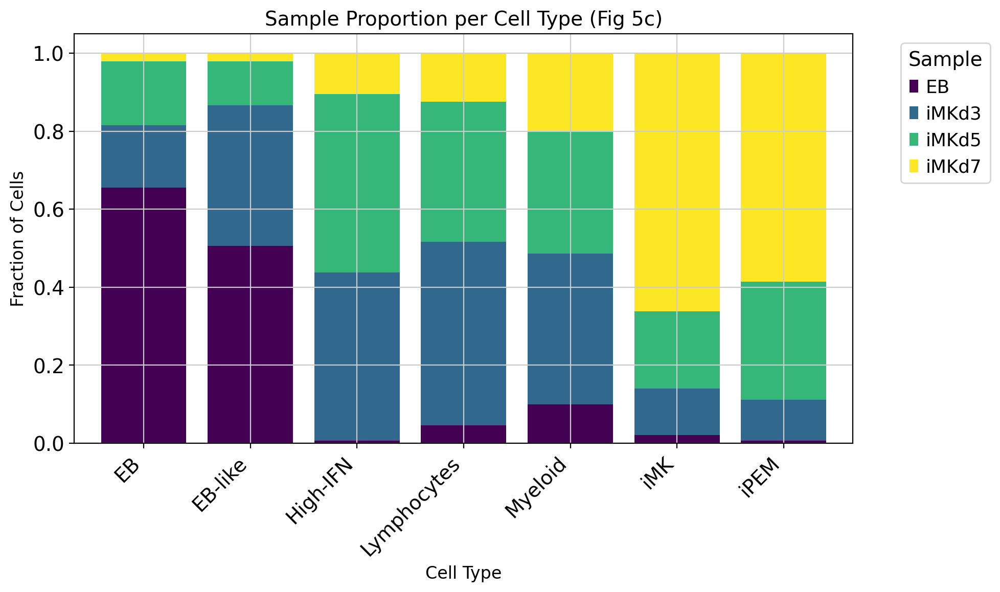

In [45]:
proportion_df = pd.crosstab(adata.obs['cell_type'], adata.obs['sample'], normalize='index')

sample_order = ['EB', 'iMKd3', 'iMKd5', 'iMKd7']
valid_order = [s for s in sample_order if s in proportion_df.columns]
if valid_order:
    proportion_df = proportion_df[valid_order]

fig, ax = plt.subplots(figsize=(10, 6))

proportion_df.plot(
    kind='bar', 
    stacked=True, 
    ax=ax, 
    colormap='viridis',
    edgecolor='none',
    width=0.8
)

plt.title("Sample Proportion per Cell Type (Fig 5c)", fontsize=14)
plt.xlabel("Cell Type", fontsize=12)
plt.ylabel("Fraction of Cells", fontsize=12)
plt.legend(title='Sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

save_path = fig_dir / "sample_proportion_stacked.png"
plt.savefig(save_path, bbox_inches='tight', dpi=300)
print(f"Sample proportion stacked bar plot saved to: {save_path}")

plt.show()

# GO analysis

Recalculating DEGs for named cell types...
Running GO analysis for: iMK...


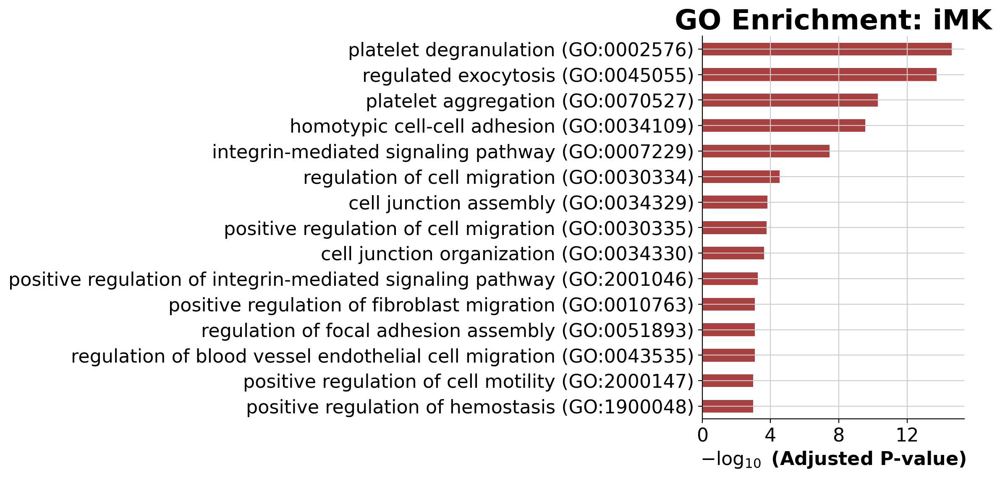

Running GO analysis for: iPEM...


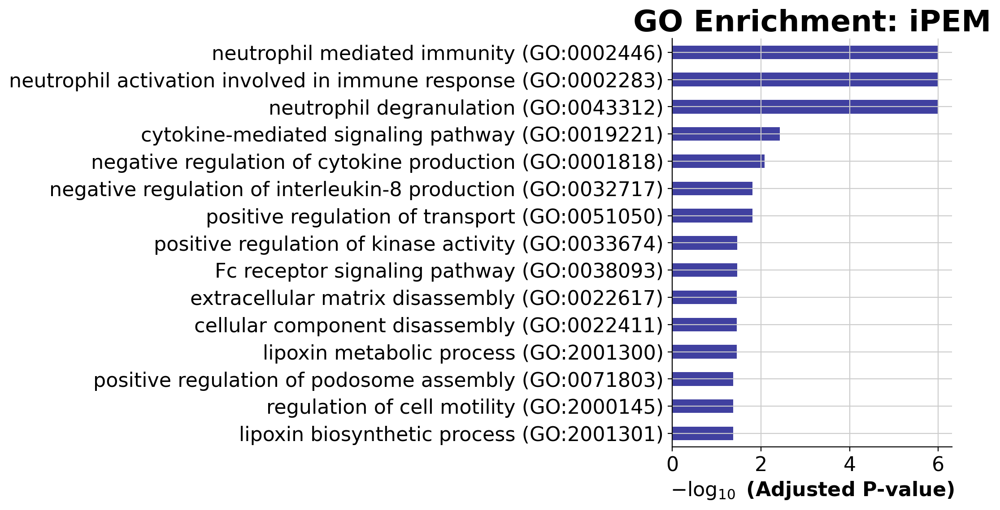

GO Analysis done.


In [ ]:
print("Recalculating DEGs for named cell types...")
sc.tl.rank_genes_groups(adata, 'cell_type', method='wilcoxon')

def run_go_analysis(cell_type_name, top_n=100):
    print(f"Running GO analysis for: {cell_type_name}...")

    gene_list = adata.uns['rank_genes_groups']['names'][cell_type_name][:top_n].tolist()
    enr = gp.enrichr(
        gene_list=gene_list,
        gene_sets='GO_Biological_Process_2021',
        organism='Human',
        outdir=None
    )
    return enr

target_meg = 'iMK'
if target_meg in adata.obs['cell_type'].unique():
    enr_meg = run_go_analysis(target_meg)

    ax = gp.barplot(
        enr_meg.res2d, 
        title=f"GO Enrichment: {target_meg}",
        top_term=15,
        color='darkred',
    )
    save_path = fig_dir / f"GO_{target_meg.replace('/', '_')}.png"
    plt.savefig(save_path, bbox_inches='tight', dpi=300)
    plt.show()

target_ery = 'iPEM'
if target_ery in adata.obs['cell_type'].unique():
    enr_ery = run_go_analysis(target_ery)

    gp.barplot(
        enr_ery.res2d, 
        title=f"GO Enrichment: {target_ery}",
        top_term=15,
        color='navy',
    )
    save_path = fig_dir / f"GO_{target_ery.replace('/', '_')}.png"
    plt.savefig(save_path, bbox_inches='tight', dpi=300)
    plt.show()

print("GO Analysis done.")

# Trajectory Analysis

Subsetting data for trajectory analysis...
Re-computing embedding and pseudotime...
Calculated root cell index: 22659


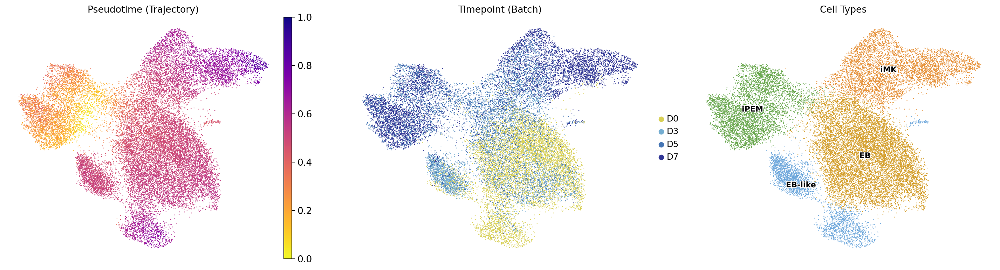

trajectory analysis completed.


In [53]:
print(f"Subsetting data for trajectory analysis...")
target_lineages = ['EB', 'EB-like', 'iPEM', 'iMK']
adata_traj = adata[adata.obs['cell_type'].isin(target_lineages)].copy()

print(f"Re-computing embedding and pseudotime...")
sc.pp.neighbors(adata_traj, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.diffmap(adata_traj)

root_group = 'EB'
eb_mask = adata_traj.obs['cell_type'] == root_group
dc1 = adata_traj.obsm['X_diffmap'][:, 1].real 
imk_mask = adata_traj.obs['cell_type'] == 'iMK'

if np.mean(dc1[eb_mask]) < np.mean(dc1[imk_mask]):
    root_idx = np.flatnonzero(eb_mask)[np.argmin(dc1[eb_mask])]
else:
    root_idx = np.flatnonzero(eb_mask)[np.argmax(dc1[eb_mask])]

adata_traj.uns['iroot'] = root_idx
print(f"Calculated root cell index: {root_idx}")

sc.tl.dpt(adata_traj)
sc.tl.umap(adata_traj)

batch_mapping = {
    'EB':    'D0',
    'iMKd3': 'D3',
    'iMKd5': 'D5',
    'iMKd7': 'D7'
}

adata_traj.obs['Day'] = adata_traj.obs['sample'].map(batch_mapping)

day_order = ['D0', 'D3', 'D5', 'D7']
adata_traj.obs['Day'] = adata_traj.obs['Day'].astype('category')
adata_traj.obs['Day'] = adata_traj.obs['Day'].cat.reorder_categories(day_order)

sc.set_figure_params(figsize=(5, 5), fontsize=12, frameon=False)

day_palette = {
    'D0': '#d8d055',
    'D3': '#74add1',
    'D5': '#4575b4',
    'D7': '#313695'
}

ctype_palette = {
    'EB': '#d5a02e',
    'EB-like': '#6fa8dc',
    'iPEM': '#6aa84f',
    'iMK': '#e69138',
    'High-IFN': '#8e7cc3'
}
valid_ctype_palette = {k: v for k, v in ctype_palette.items() if k in adata_traj.obs['cell_type'].unique()}

fig, axs = plt.subplots(1, 3, figsize=(18, 5))

sc.pl.umap(
    adata_traj, 
    color='dpt_pseudotime', 
    color_map='plasma_r',
    ax=axs[0],
    show=False,
    title='Pseudotime (Trajectory)',
    frameon=False,
    colorbar_loc='right'
)

sc.pl.umap(
    adata_traj, 
    color='Day', 
    palette=day_palette,
    ax=axs[1],
    show=False,
    title='Timepoint (Batch)',
    frameon=False
)

sc.pl.umap(
    adata_traj, 
    color='cell_type', 
    palette=valid_ctype_palette,
    ax=axs[2],
    show=False,
    title='Cell Types',
    frameon=False,
    legend_loc='on data',
    legend_fontsize=10,
    legend_fontoutline=2
)

plt.tight_layout()
plt.savefig("results/figures/trajectory_analysis.png", bbox_inches='tight', dpi=300)
plt.show()

print("trajectory analysis completed.")